# Monocular depth estimation

**Author:** [Rishabh Singh Kushwaha]<br>
**Date created:** 2024/05/25<br>
**Last modified:** 2024/06/12<br>
**Description:** Implement a depth estimation model with a convolutional neural network.

## Introduction

_Depth estimation_ is a crucial step towards inferring scene geometry from 2D images.
The goal in _monocular depth estimation_ is to predict the depth value of each pixel or
inferring depth information, given only a single RGB image as input.
This example will show an approach to build a depth estimation model with a unet
and combined loss functions.


## Setup

In [1]:
import os
import sys

import tensorflow as tf
from tensorflow.keras import layers

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

tf.random.set_seed(123)

## Downloading the dataset

We will be using the dataset **DIODE: A Dense Indoor and Outdoor Depth Dataset**  for this
tutorial. However, we use the validation set generating training and evaluation subsets
for our model. The reason we use the validation set rather than the training set of the original dataset is because
the training set consists of 81GB of data, which is challenging to download compared
to the validation set which is only 2.6GB.


In [2]:
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,
    )

2774625282/2774625282 [==============================] - 87s 0us/step


##  Preparing the dataset

We only use the indoor images to train our depth estimation model.

In [30]:
path = "val/indoors"

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {
    "image": [x for x in filelist if x.endswith(".png")],
    "depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")],
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

## Preparing hyperparameters

In [50]:
HEIGHT = 256
WIDTH = 256
LR = 0.0002
EPOCHS = 10
BATCH_SIZE = 24

## Building a data pipeline

1. The pipeline takes a dataframe containing the path for the RGB images,
as well as the depth and depth mask files.
2. It reads and resize the RGB images.
3. It reads the depth and depth mask files, process them to generate the depth map image and
resize it.
4. It returns the RGB images and the depth map images for a batch.

In [43]:

class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True, augment =False):

        #Initialization
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.augment = augment
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """"""
        #Updates indexes after each epoch

        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """

"""
        #Load input and target image.

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def augment_image(self, image, depth_map):
        """ Apply random transformations to the image and depth map."""

        if tf.random.uniform(()) > 0.5:
            image = tf.image.flip_left_right(image)
            depth_map = tf.image.flip_left_right(depth_map)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.flip_up_down(image)
            depth_map = tf.image.flip_up_down(depth_map)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_brightness(image, max_delta=0.1)
        if tf.random.uniform(()) > 0.5:
            image = tf.image.random_contrast(image, lower=0.9, upper=1.1)

        return image, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            #x[i,], y[i,] = self.load(
            image_, depth_map = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )
            if self.augment:
                image_, depth_map = self.augment_image(image_, depth_map)

            x[i,] = image_
            y[i,] = depth_map

        return x, y



## Visualizing samples



1.   Visualize predicted and ground truth depth maps.
2.   Calculate RMSE for predicted depth map with respect to corresponding ground truth.



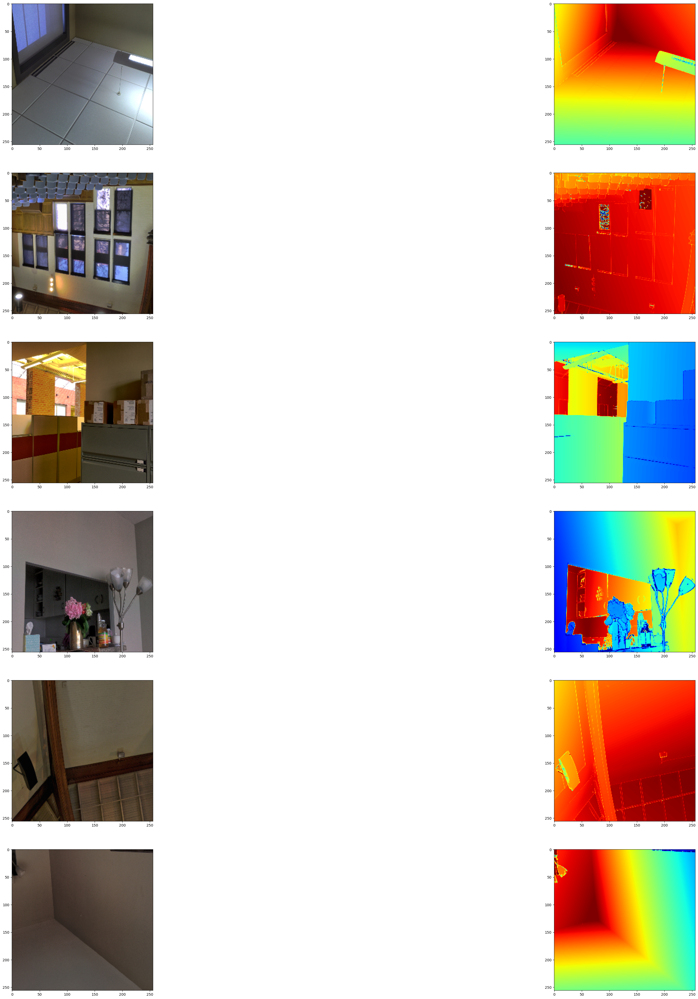

In [44]:

def rmse(y_true, y_pred):
    print(np.sqrt(np.mean((y_true - y_pred) ** 2)))
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            rmse_value = rmse(target[i].squeeze(), pred[i].squeeze())
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)
            #ax[i, 3].text(0.5, 0.5, f'RMSE: {rmse_value:.4f}', fontsize=20, ha='center')
            #ax[i, 3].text(0.5, 0.5, f'RMSE: {rmse_value:.4f}', fontsize=20, ha='center', va='center')
            #ax[i, 3].axis('off')

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(
    iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH), augment=True))
)
visualize_depth_map(visualize_samples)

## 3D point cloud visualization

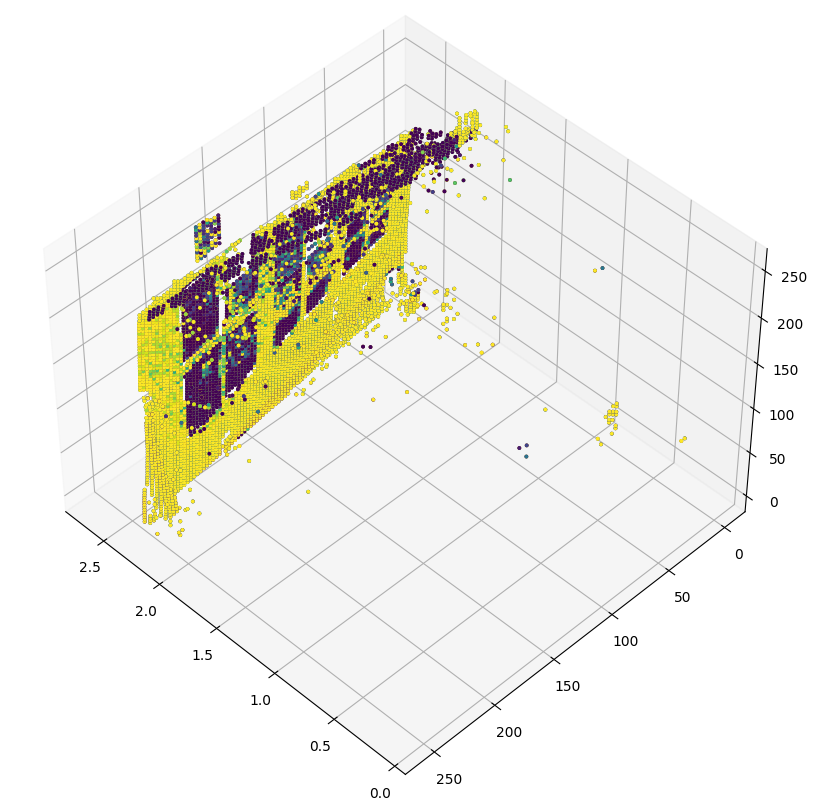

In [45]:
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter(
            [depth_vis[x, y]] * 3,
            [y] * 3,
            [x] * 3,
            c=tuple(img_vis[x, y, :3] / 255),
            s=3,
        )
    ax.view_init(45, 135)

## Building the model

1. The basic model is from U-Net.
2. It comprises of 3 encoder layers followed by bottleneck and then decoder.


In [46]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    def conv_block(x, filters, kernel_size=3, padding='same', strides=1):
        x = Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)
        x = Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
        #x = BatchNormalization()(x)
        x = Activation('relu')(x)
        return x

    # Encoder
    conv1 = conv_block(inputs, 64)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = conv_block(pool3, 512)

    # Decoder
    up5 = UpSampling2D(size=(2, 2))(conv4)
    up5 = concatenate([up5, conv3], axis=-1)
    conv5 = conv_block(up5, 256)

    up6 = UpSampling2D(size=(2, 2))(conv5)
    up6 = concatenate([up6, conv2], axis=-1)
    conv6 = conv_block(up6, 128)

    up7 = UpSampling2D(size=(2, 2))(conv6)
    up7 = concatenate([up7, conv1], axis=-1)
    conv7 = conv_block(up7, 64)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv7)

    model = Model(inputs, outputs)
    return model

def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def combined_loss(y_true, y_pred):
    ssim_weight = 0.85
    l1_weight = 0.1
    edge_weight = 0.05

    # SSIM loss
    ssim = ssim_loss(y_true, y_pred)

    # L1 loss
    l1 = tf.reduce_mean(tf.abs(y_true - y_pred))

    # Edge-aware smoothness loss
    dy_true, dx_true = tf.image.image_gradients(y_true)
    dy_pred, dx_pred = tf.image.image_gradients(y_pred)
    weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
    weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))
    smoothness_x = dx_pred * weights_x
    smoothness_y = dy_pred * weights_y
    edge_smoothness = tf.reduce_mean(tf.abs(smoothness_x)) + tf.reduce_mean(tf.abs(smoothness_y))

    return ssim_weight * ssim + l1_weight * l1 + edge_weight * edge_smoothness

model = unet_model()

#optimizer = Adam(learning_rate=1e-4, amsgrad=True)
#model.compile(optimizer=optimizer, loss=combined_loss)
#model.summary()



## Defining the loss

We will optimize 3 losses in our mode.
1. Structural similarity index(SSIM).
2. L1-loss, or Point-wise depth in our case.
3. Depth smoothness loss.
4. SILog Loss

In [47]:
class DepthEstimationModel(tf.keras.Model):
    def __init__(self, input_size=(256, 256, 3)):
        super().__init__()
        self.model = unet_model(input_size)
        self.loss_metric = tf.keras.metrics.Mean(name="loss")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(abs(smoothness_y))

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1 - tf.image.ssim(target, pred, max_val=1.0)
        )

        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (0.5 * ssim_loss)
            + (0.05 * l1_loss)
            + (0.45 * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self.model(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.model.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))
        self.loss_metric.update_state(loss)

        return {"loss": self.loss_metric.result()}

    def test_step(self, batch_data):
        input, target = batch_data
        pred = self.model(input, training=False)
        loss = self.calculate_loss(target, pred)
        self.loss_metric.update_state(loss)
        return {"loss": self.loss_metric.result()}

    def call(self, inputs):
        return self.model(inputs)


## Model training

In [52]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LR,
    amsgrad=True,
)
# model = DepthEstimationModel()

# Compile the model
model = DepthEstimationModel()
model.compile(optimizer)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH)
)
model.fit(
    train_loader,
    epochs=EPOCHS,
    validation_data=validation_loader,
)


Epoch 1/30
9/9 [==============================] - 29s 2s/step - loss: 0.2649 - val_loss: 0.1915
Epoch 2/30
9/9 [==============================] - 20s 2s/step - loss: 0.2042 - val_loss: 0.2090                                                                                                                                                                      
Epoch 3/30
9/9 [==============================] - 20s 2s/step - loss: 0.1967 - val_loss: 0.2063                                                                                                                                                                      
Epoch 4/30
9/9 [==============================] - 20s 2s/step - loss: 0.1950 - val_loss: 0.2055                                                                                                                                                                      
Epoch 5/30
9/9 [==============================] - 20s 2s/step - loss: 0.1937 - val_loss: 0.2046                       

## Visualizing model output

We visualize the model output over the validation set.
The first image is the RGB image, the second image is the ground truth depth map image
and the third one is the predicted depth map image.

1/1 [==============================] - 0s 244ms/step
0.3624684998525566
0.611355922960285
0.22379755058414502
0.43658755509720665
0.8146723370703687
0.789819779630776
1/1 [==============================] - 0s 25ms/step
1.6596868516929766
0.7742116707294192
0.5463466690865395
0.785148095427523
0.8104234190055343
0.27152315075484384


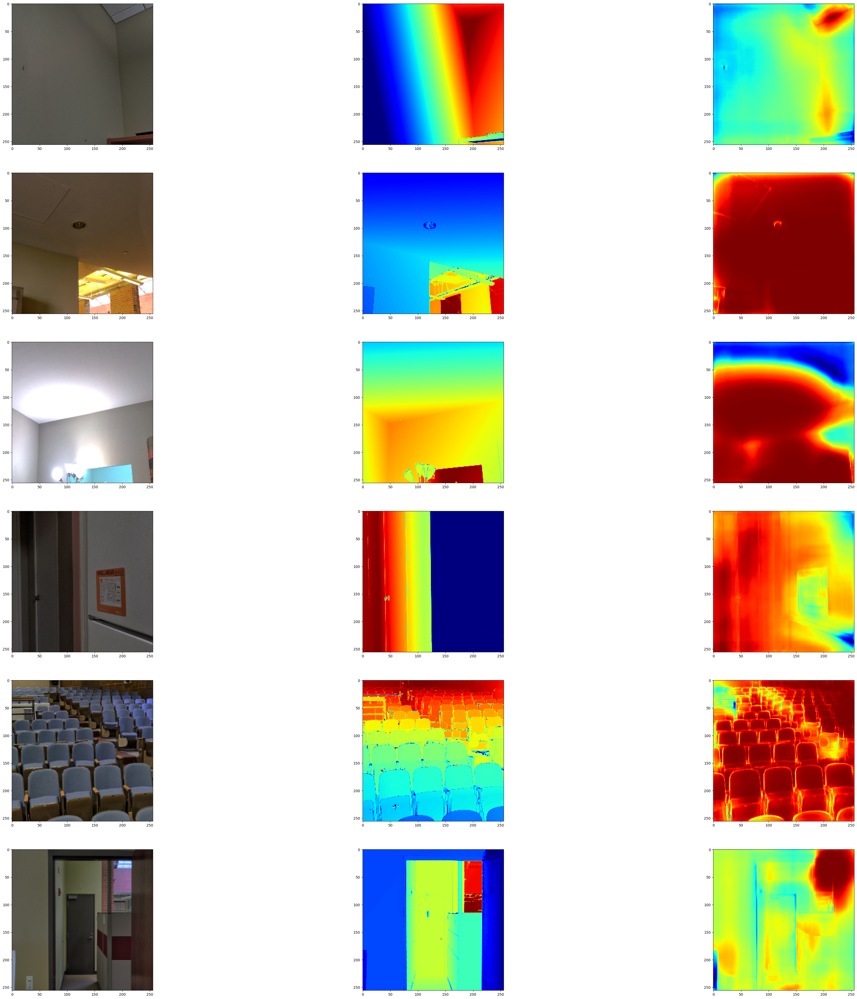

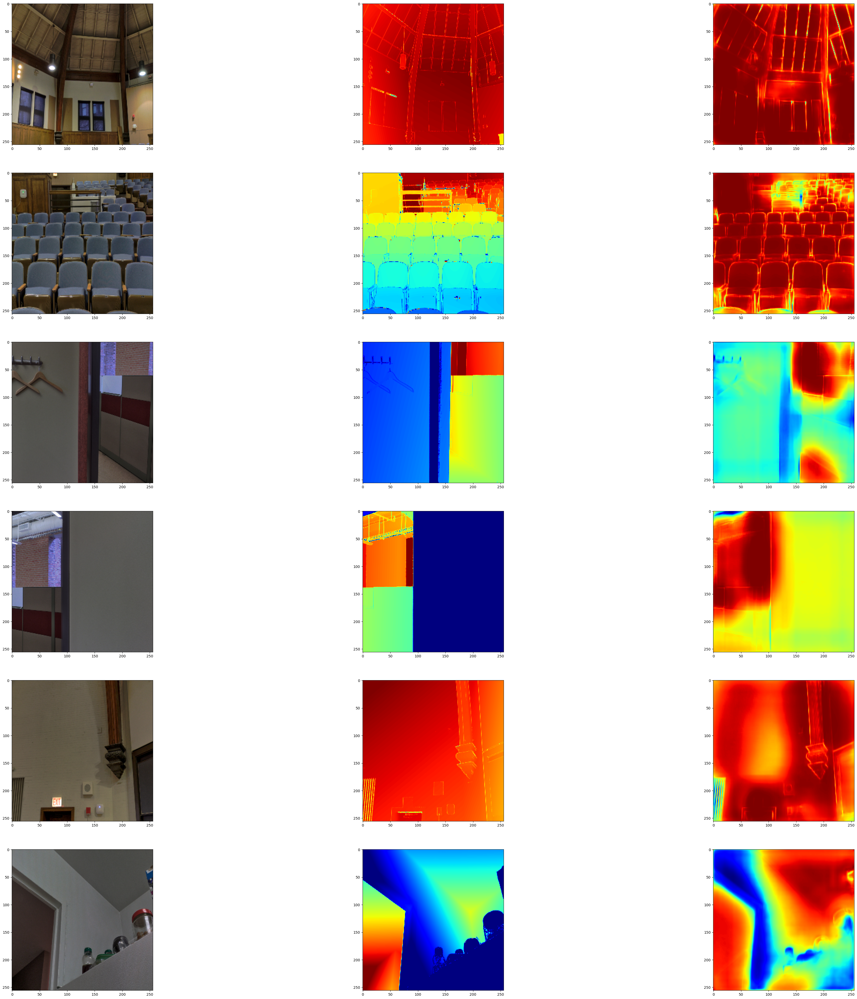

In [53]:
#from google.colab import drive
#drive.mount('/content/drive')

# Save the model to Google Drive
model.save('/content/drive/My Drive/CS231A models/CHATGPT_UNET_model')
test_loader = next(
    iter(
        DataGenerator(
            data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(
    iter(
        DataGenerator(
            data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH)
        )
    )
)
visualize_depth_map(test_loader, test=True, model=model)

## References

The following papers go deeper into possible approaches for depth estimation.
1. [Depth Prediction Without the Sensors: Leveraging Structure for Unsupervised Learning from Monocular Videos](https://arxiv.org/pdf/1811.06152v1.pdf)
2. [Digging Into Self-Supervised Monocular Depth Estimation](https://openaccess.thecvf.com/content_ICCV_2019/papers/Godard_Digging_Into_Self-Supervised_Monocular_Depth_Estimation_ICCV_2019_paper.pdf)
3. [Deeper Depth Prediction with Fully Convolutional Residual Networks](https://arxiv.org/pdf/1606.00373v2.pdf)

You can also find helpful implementations in the papers with code depth estimation task.

You can use the trained model hosted on [Hugging Face Hub](https://huggingface.co/spaces/keras-io/Monocular-Depth-Estimation) and try the demo on [Hugging Face Spaces](https://huggingface.co/keras-io/monocular-depth-estimation).